# NIW Conjugate Prior vs. Separate Priors Comparison

This notebook demonstrates the difference between Normal-Inverse-Wishart (NIW) conjugate priors and separate independent priors for means and covariances in Gaussian Mixture Models.

We will create a modified version of the GMM class to force separate prior updates, allowing us to compare the two approaches side by side.

In [16]:
import numpy as np
import torch
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import sys
import os

# Add the parent directory to the path to import tgmm
sys.path.append(os.path.abspath('..'))
from tgmm import GaussianMixture
from tgmm.plotting import plot_gmm

# Set random seeds for reproducibility
np.random.seed(42)
torch.manual_seed(42)

# Set device
device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f"Using device: {device}")

Using device: cuda


## Normal-Inverse-Wishart (NIW) Conjugate Prior Mathematical Background

The Normal-Inverse-Wishart (NIW) prior is a **conjugate prior** for the parameters of a multivariate Gaussian distribution when both the mean $\boldsymbol{\mu}$ and covariance matrix $\boldsymbol{\Sigma}$ are unknown. This is fundamentally different from specifying separate priors for means and covariances.

### Mathematical Formulation

For a multivariate Gaussian component with parameters $(\boldsymbol{\mu}, \boldsymbol{\Sigma})$, the NIW prior is defined as:

$$p(\boldsymbol{\mu}, \boldsymbol{\Sigma}^{-1}) = \mathcal{N}(\boldsymbol{\mu} | \boldsymbol{m}_0, (\lambda_0 \boldsymbol{\Sigma})^{-1}) \cdot \mathcal{W}(\boldsymbol{\Sigma}^{-1} | \nu_0, \boldsymbol{\Psi}_0^{-1})$$

Where:
- $\boldsymbol{m}_0$: prior mean (hyperparameter)
- $\lambda_0$: prior precision parameter (controls how tightly the mean is constrained around $\boldsymbol{m}_0$)
- $\nu_0$: degrees of freedom for the Wishart distribution
- $\boldsymbol{\Psi}_0$: scale matrix for the Wishart distribution

### Key Properties of NIW Prior

1. **Conjugacy**: The posterior distribution is also NIW, making Bayesian inference analytically tractable.

2. **Coupling**: The mean and covariance are coupled through the precision parameter $\lambda_0$. When $\boldsymbol{\Sigma}$ is large (uncertain), the mean prior becomes less informative automatically.

3. **Natural Parameterization**: The NIW prior naturally captures the relationship between mean uncertainty and covariance uncertainty.

### NIW Posterior Updates

Given data points assigned to component $k$, the NIW posterior parameters are:

$$\lambda_n = \lambda_0 + n_k$$

$$\nu_n = \nu_0 + n_k$$

$$\boldsymbol{m}_n = \frac{\lambda_0 \boldsymbol{m}_0 + n_k \bar{\boldsymbol{x}}_k}{\lambda_0 + n_k}$$

$$\boldsymbol{\Psi}_n = \boldsymbol{\Psi}_0 + \mathbf{S}_k + \frac{\lambda_0 n_k}{\lambda_0 + n_k}(\bar{\boldsymbol{x}}_k - \boldsymbol{m}_0)(\bar{\boldsymbol{x}}_k - \boldsymbol{m}_0)^T$$

where $\mathbf{S}_k$ is the scatter matrix for component $k$.

### Why NIW ≠ Separate Mean + Covariance Priors

When using **separate priors**:
- Mean prior: $p(\boldsymbol{\mu}) = \mathcal{N}(\boldsymbol{\mu} | \boldsymbol{m}_0, \tau_0^2 \mathbf{I})$
- Covariance prior: $p(\boldsymbol{\Sigma}^{-1}) = \mathcal{W}(\boldsymbol{\Sigma}^{-1} | \nu_0, \boldsymbol{\Psi}_0^{-1})$

The key differences are:

1. **Independence vs. Coupling**: Separate priors assume independence between mean and covariance uncertainty, while NIW couples them naturally.

2. **Prior Strength Interpretation**: In NIW, $\lambda_0$ controls how much the mean prior strength depends on the current covariance estimate. In separate priors, mean and covariance prior strengths are fixed independently.

3. **Bayesian Updates**: NIW updates both parameters simultaneously with proper coupling, while separate priors update them independently.

## Modified GMM Class for Comparison

We'll create a modified version of the GaussianMixture class that allows us to force separate prior updates even when both mean and covariance priors are provided.

In [17]:
class GaussianMixtureComparison(GaussianMixture):
    """
    Modified GaussianMixture class that allows forcing separate prior updates
    for comparison with NIW conjugate priors.
    """
    
    def __init__(self, force_separate_priors=False, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.force_separate_priors = force_separate_priors
    
    def _m_step_separate_priors(self, X, resp):
        """
        M-step with forced separate prior updates (no NIW coupling).
        """
        n_samples = X.size(0)
        nk = resp.sum(dim=0) + 1e-20

        # Update weights (same as original)
        if self.use_weight_prior:
            alpha = self.weight_concentration_prior
            total_alpha = alpha.sum()
            self.weights_ = (nk + alpha - 1.0) / (n_samples + total_alpha - self.n_components)
        else:
            self.weights_ = nk / n_samples
        self.weights_.clamp_(min=1e-20)

        # Force separate updates even if both priors are present
        # Update means independently
        if self.use_mean_prior:
            kappa0 = self.mean_precision_prior
            numerator = resp.t() @ X + kappa0 * self.mean_prior
            denom = nk.unsqueeze(1) + kappa0
            self.means_ = numerator / denom
        else:
            self.means_ = (resp.t() @ X) / nk.unsqueeze(1)

        # Update covariances independently
        if self.use_covariance_prior:
            self._update_covariances_map(X, resp, nk)
        else:
            self._update_covariances_mle(X, resp, nk)
    
    def _m_step(self, X, resp):
        """
        Override M-step to allow forcing separate priors.
        """
        if self.force_separate_priors:
            self._m_step_separate_priors(X, resp)
        else:
            # Use the original M-step (which includes NIW when both priors are present)
            super()._m_step(X, resp)

print("Modified GaussianMixture class created successfully!")

Modified GaussianMixture class created successfully!


## Generate Synthetic Data

We'll create synthetic 2D data with three well-separated Gaussian components to clearly observe the differences between the two approaches.

Generated 300 samples with 2 features
Data shape: (300, 2)
Data range: X1=[-4.31, 3.58], X2=[-3.91, 3.38]


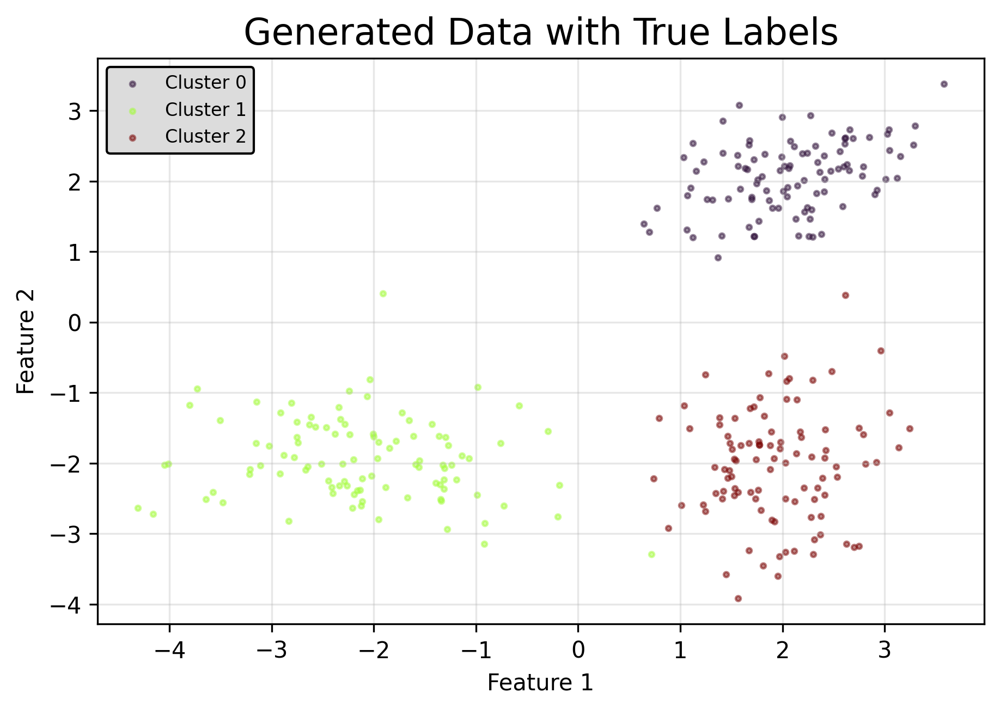

In [18]:
# Create synthetic 2D data with clear structure
n_samples_per_component = 100
true_means = np.array([
    [2.0, 2.0], 
    [-2.0, -2.0], 
    [2.0, -2.0]
])
true_covs = np.array([
    [[0.5, 0.2], [0.2, 0.3]],
    [[0.8, -0.1], [-0.1, 0.4]], 
    [[0.3, 0.0], [0.0, 0.6]]
])

# Generate data
X_list = []
colors = ['red', 'blue', 'green']
for i, (mean, cov) in enumerate(zip(true_means, true_covs)):
    X_component = np.random.multivariate_normal(mean, cov, n_samples_per_component)
    X_list.append(X_component)

X = np.vstack(X_list)
X_tensor = torch.tensor(X, dtype=torch.float32, device=device)
n_samples, n_features = X.shape
n_components = 3

# Plot the generated data
plt.figure()
plot_gmm(X_tensor.cpu().numpy(), true_labels=np.repeat(np.arange(n_components), n_samples_per_component), title="Generated Data with True Labels")

print(f"Generated {n_samples} samples with {n_features} features")
print(f"Data shape: {X.shape}")
print(f"Data range: X1=[{X[:, 0].min():.2f}, {X[:, 0].max():.2f}], X2=[{X[:, 1].min():.2f}, {X[:, 1].max():.2f}]")

## Define Prior Hyperparameters

We'll set up the same prior hyperparameters for both approaches to ensure a fair comparison.

In [19]:
# Define NIW hyperparameters
lambda0 = 20  # Prior precision parameter - moderate coupling
nu0 = n_features + 100  # Degrees of freedom (weak prior)
m0 = torch.zeros(n_components, n_features, device=device)  # Prior mean at origin

# Scale matrix (we expect unit covariances)
Psi0 = torch.eye(n_features, device=device).unsqueeze(0).expand(n_components, -1, -1) * 100.0

print("Prior Hyperparameters:")
print(f"λ₀ (precision parameter): {lambda0}")
print(f"ν₀ (degrees of freedom): {nu0}")
print(f"m₀ (prior mean): {m0[0].cpu().numpy()}")
print(f"Ψ₀ (scale matrix): \n{Psi0[0].cpu().numpy()}")
print(f"\nNote: All three components use the same prior hyperparameters")

Prior Hyperparameters:
λ₀ (precision parameter): 20
ν₀ (degrees of freedom): 102
m₀ (prior mean): [0. 0.]
Ψ₀ (scale matrix): 
[[100.   0.]
 [  0. 100.]]

Note: All three components use the same prior hyperparameters


## Comparison: NIW Conjugate vs. Separate Priors

Now we'll fit the same data using four different configurations:
1. **Mean Prior Only**: Prior on means, MLE for covariances
2. **Covariance Prior Only**: Prior on covariances, MLE for means  
3. **Separate Priors**: Independent mean and covariance priors
4. **NIW Conjugate Prior**: Coupled prior on both parameters

This will highlight how the coupling in NIW differs from independent priors.

Fitting Mean Prior Only...
Fitting Covariance Prior Only...
Fitting Separate Priors...


Fitting NIW Conjugate Prior...


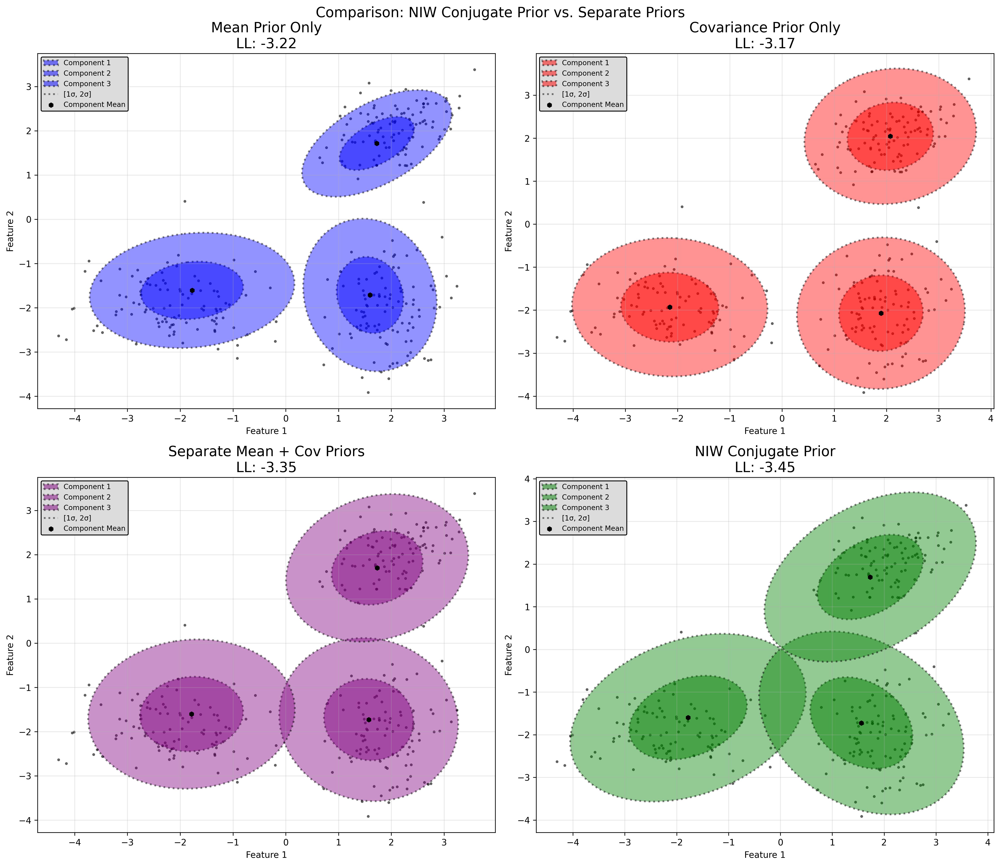

In [20]:
# Set up the comparison
fig, axes = plt.subplots(2, 2, figsize=(16, 14))
fig.suptitle("Comparison: NIW Conjugate Prior vs. Separate Priors", fontsize=16, y=0.98)

models = {}
results = {}

# 1. Mean Prior Only (top-left)
print("Fitting Mean Prior Only...")
ax = axes[0, 0]
models['mean_only'] = GaussianMixtureComparison(
    n_features=n_features,
    n_components=n_components,
    covariance_type='full',
    max_iter=1000,
    device=device,
    mean_prior=m0,
    mean_precision_prior=lambda0,
    # No covariance prior - uses MLE
    force_separate_priors=True  # This doesn't matter here since only mean prior is used
)
models['mean_only'].fit(X_tensor)

plot_gmm(
    X=X,
    gmm=models['mean_only'],
    ax=ax,
    title=f"Mean Prior Only\nLL: {models['mean_only'].lower_bound_:.2f}",
    ellipse_colors='blue',
    ellipse_std_devs=[1, 2]
)

# 2. Covariance Prior Only (top-right)  
print("Fitting Covariance Prior Only...")
ax = axes[0, 1]
models['cov_only'] = GaussianMixtureComparison(
    n_features=n_features,
    n_components=n_components,
    covariance_type='full',
    max_iter=1000,
    device=device,
    covariance_prior=Psi0,
    degrees_of_freedom_prior=nu0,
    # No mean prior - uses MLE
    force_separate_priors=True  # This doesn't matter here since only covariance prior is used
)
models['cov_only'].fit(X_tensor)

plot_gmm(
    X=X,
    gmm=models['cov_only'],
    ax=ax,
    title=f"Covariance Prior Only\nLL: {models['cov_only'].lower_bound_:.2f}",
    ellipse_colors='red',
    ellipse_std_devs=[1, 2]
)

# 3. Both Priors Separately (bottom-left)
print("Fitting Separate Priors...")
ax = axes[1, 0]
models['separate'] = GaussianMixtureComparison(
    n_features=n_features,
    n_components=n_components,
    covariance_type='full',
    max_iter=1000,
    device=device,
    mean_prior=m0,
    mean_precision_prior=lambda0,
    covariance_prior=Psi0,
    degrees_of_freedom_prior=nu0,
    force_separate_priors=True  # Force separate updates
)
models['separate'].fit(X_tensor)

plot_gmm(
    X=X,
    gmm=models['separate'],
    ax=ax,
    title=f"Separate Mean + Cov Priors\nLL: {models['separate'].lower_bound_:.2f}",
    ellipse_colors='purple',
    ellipse_std_devs=[1, 2]
)

# 4. NIW Conjugate Prior (bottom-right)
print("Fitting NIW Conjugate Prior...")
ax = axes[1, 1]
models['niw'] = GaussianMixtureComparison(
    n_features=n_features,
    n_components=n_components,
    covariance_type='full',
    max_iter=1000,
    device=device,
    mean_prior=m0,
    mean_precision_prior=lambda0,
    covariance_prior=Psi0,
    degrees_of_freedom_prior=nu0,
    force_separate_priors=False  # Use NIW conjugate updates
)
models['niw'].fit(X_tensor)

plot_gmm(
    X=X,
    gmm=models['niw'],
    ax=ax,
    title=f"NIW Conjugate Prior\nLL: {models['niw'].lower_bound_:.2f}",
    ellipse_colors='green',
    ellipse_std_devs=[1, 2]
)

plt.tight_layout()
plt.show()


## Quantitative Parameter Comparison

Let's examine the numerical differences between the fitted parameters for each approach.

In [21]:
print("="*80)
print("DETAILED PARAMETER COMPARISON")
print("="*80)

# Compare final means
print("\n📍 FINAL MEANS COMPARISON:")
print("-" * 50)
for name, model in models.items():
    means = model.means_.cpu().numpy()
    distances_from_prior = torch.norm(model.means_ - m0, dim=1).cpu().numpy()
    print(f"{name.upper():20s}: {means}")
    print(f"{'Distance from prior':20s}: {distances_from_prior}")
    print()

# Compare final covariances (determinants as a measure of volume)
print("\n📊 COVARIANCE DETERMINANTS (Volume Measure):")
print("-" * 50)
for name, model in models.items():
    covs = model.covariances_.cpu().numpy()
    dets = [np.linalg.det(cov) for cov in covs]
    print(f"{name.upper():20s}: {dets}")

# Compare log-likelihoods
print("\n📈 LOG-LIKELIHOOD COMPARISON:")
print("-" * 50)
for name, model in models.items():
    ll = model.lower_bound_
    print(f"{name.upper():20s}: {ll:.4f}")

# Compare distances between separate and NIW approaches
print("\n🔍 KEY DIFFERENCES (Separate vs NIW):")
print("-" * 50)
mean_diff = torch.norm(models['separate'].means_ - models['niw'].means_).item()
print(f"Mean parameter difference (Frobenius norm): {mean_diff:.6f}")

cov_diff = torch.norm(models['separate'].covariances_ - models['niw'].covariances_).item()
print(f"Covariance parameter difference (Frobenius norm): {cov_diff:.6f}")

ll_diff = models['niw'].lower_bound_ - models['separate'].lower_bound_
print(f"Log-likelihood difference (NIW - Separate): {ll_diff:.6f}")

if abs(ll_diff) > 1e-3:
    print(f"⚠️  Significant difference detected! The coupling in NIW affects the solution.")
else:
    print(f"✅ Small difference suggests similar solutions, but NIW is more principled.")

DETAILED PARAMETER COMPARISON

📍 FINAL MEANS COMPARISON:
--------------------------------------------------
MEAN_ONLY           : [[ 1.7262912  1.7152877]
 [-1.7751353 -1.6069891]
 [ 1.5965908 -1.7119129]]
Distance from prior : [2.433576 2.394477 2.340886]

COV_ONLY            : [[ 1.8955199 -2.0705037]
 [-2.14778   -1.9311383]
 [ 2.0751586  2.0431178]]
Distance from prior : [2.8071303 2.888296  2.9121494]

SEPARATE            : [[ 1.5720819 -1.7280672]
 [ 1.732481   1.7018588]
 [-1.7852889 -1.602705 ]]
Distance from prior : [2.336163  2.4285414 2.39915  ]

NIW                 : [[-1.7798475 -1.6009003]
 [ 1.5618328 -1.7247043]
 [ 1.7317004  1.6958153]]
Distance from prior : [2.393896  2.3267846 2.4237525]


📊 COVARIANCE DETERMINANTS (Volume Measure):
--------------------------------------------------
MEAN_ONLY           : [np.float32(0.12692724), np.float32(0.3953223), np.float32(0.29523677)]
COV_ONLY            : [np.float32(0.50243926), np.float32(0.5689505), np.float32(0.417877)]
S

## Parameter Sensitivity Analysis

### 1. Effect of Coupling Parameter λ₀

The coupling parameter λ₀ in the NIW prior controls how tightly the mean is constrained relative to the covariance uncertainty. Let's explore how different values of λ₀ affect the results.

Fitting NIW with λ₀ = 0.01...
Fitting NIW with λ₀ = 0.1...
Fitting NIW with λ₀ = 1.0...
Fitting NIW with λ₀ = 10.0...
Fitting NIW with λ₀ = 100.0...


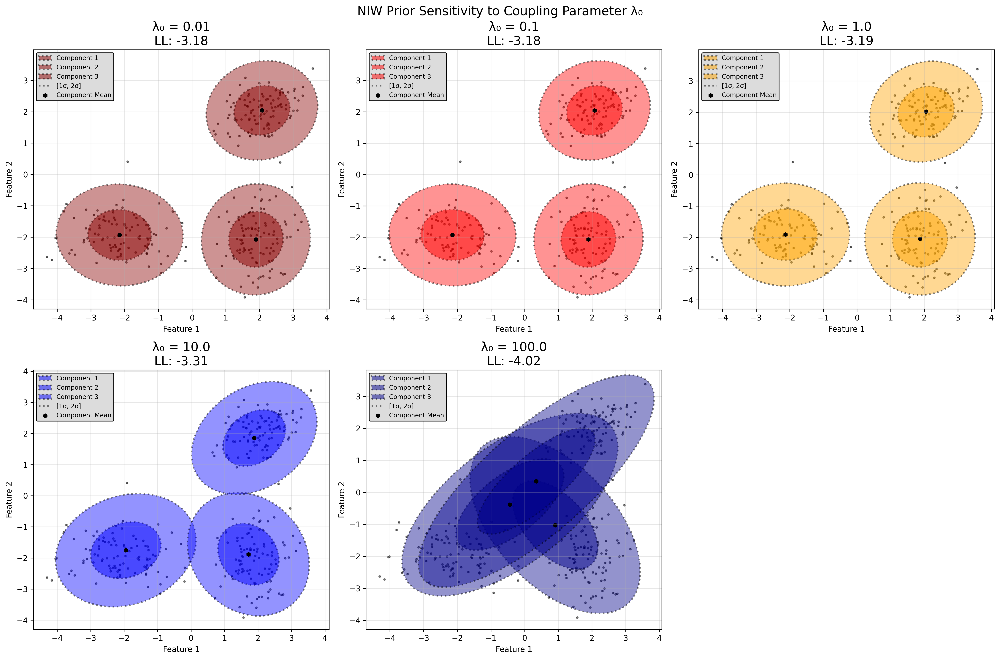


📊 EFFECT OF COUPLING PARAMETER λ₀:
------------------------------------------------------------
    λ₀  Log-Likelihood  Mean Deviation       Interpretation
------------------------------------------------------------
  0.01         -3.1751          2.8688        Weak coupling
  0.10         -3.1761          2.8662        Weak coupling
  1.00         -3.1869          2.8404    Moderate coupling
 10.00         -3.3125          2.6044      Strong coupling
100.00         -4.0198          0.8148      Strong coupling

💡 Observations:
   • Small λ₀: Weak coupling → means drift away from prior
   • Large λ₀: Strong coupling → means stay close to prior
   • λ₀ controls the balance between data fit and prior belief


In [22]:
# Test different coupling strengths
lambda_values = [0.01, 0.1, 1.0, 10.0, 100.0]
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle("NIW Prior Sensitivity to Coupling Parameter λ₀", fontsize=16, y=0.98)

niw_models_lambda = {}
colors_lambda = ['darkred', 'red', 'orange', 'blue', 'darkblue']

for i, lambda_val in enumerate(lambda_values):
    if i < 6:  # We have 6 subplots (2x3)
        row = i // 3
        col = i % 3
        ax = axes[row, col]
        
        print(f"Fitting NIW with λ₀ = {lambda_val}...")
        
        # Fit GMM with different lambda values
        niw_models_lambda[lambda_val] = GaussianMixtureComparison(
            n_features=n_features,
            n_components=n_components,
            covariance_type='full',
            max_iter=1000,
            device=device,
            mean_prior=m0,
            mean_precision_prior=lambda_val,
            covariance_prior=Psi0,
            degrees_of_freedom_prior=nu0,
            force_separate_priors=False  # Use NIW
        )
        niw_models_lambda[lambda_val].fit(X_tensor)
        
        plot_gmm(
            X=X,
            gmm=niw_models_lambda[lambda_val],
            ax=ax,
            title=f"λ₀ = {lambda_val}\nLL: {niw_models_lambda[lambda_val].lower_bound_:.2f}",
            ellipse_colors=colors_lambda[i],
            ellipse_std_devs=[1, 2]
        )

# Remove empty subplot
axes[1, 2].remove()

plt.tight_layout()
plt.show()

# Analyze the effect of lambda
print("\n📊 EFFECT OF COUPLING PARAMETER λ₀:")
print("-" * 60)
print(f"{'λ₀':>6s} {'Log-Likelihood':>15s} {'Mean Deviation':>15s} {'Interpretation':>20s}")
print("-" * 60)

for lambda_val in lambda_values:
    model = niw_models_lambda[lambda_val]
    mean_devs = torch.norm(model.means_ - m0, dim=1).cpu().numpy()
    avg_deviation = np.mean(mean_devs)
    ll = model.lower_bound_
    
    if lambda_val <= 0.1:
        interpretation = "Weak coupling"
    elif lambda_val <= 1.0:
        interpretation = "Moderate coupling"
    else:
        interpretation = "Strong coupling"
    
    print(f"{lambda_val:6.2f} {ll:15.4f} {avg_deviation:15.4f} {interpretation:>20s}")

print("\n💡 Observations:")
print("   • Small λ₀: Weak coupling → means drift away from prior")
print("   • Large λ₀: Strong coupling → means stay close to prior")
print("   • λ₀ controls the balance between data fit and prior belief")

### 2. Effect of Degrees of Freedom ν₀

The degrees of freedom parameter ν₀ controls the strength of the covariance prior. Higher values make the prior more informative (stronger).

Fitting NIW with ν₀ = 3...
Fitting NIW with ν₀ = 7...
Fitting NIW with ν₀ = 22...
Fitting NIW with ν₀ = 102...
Fitting NIW with ν₀ = 502...


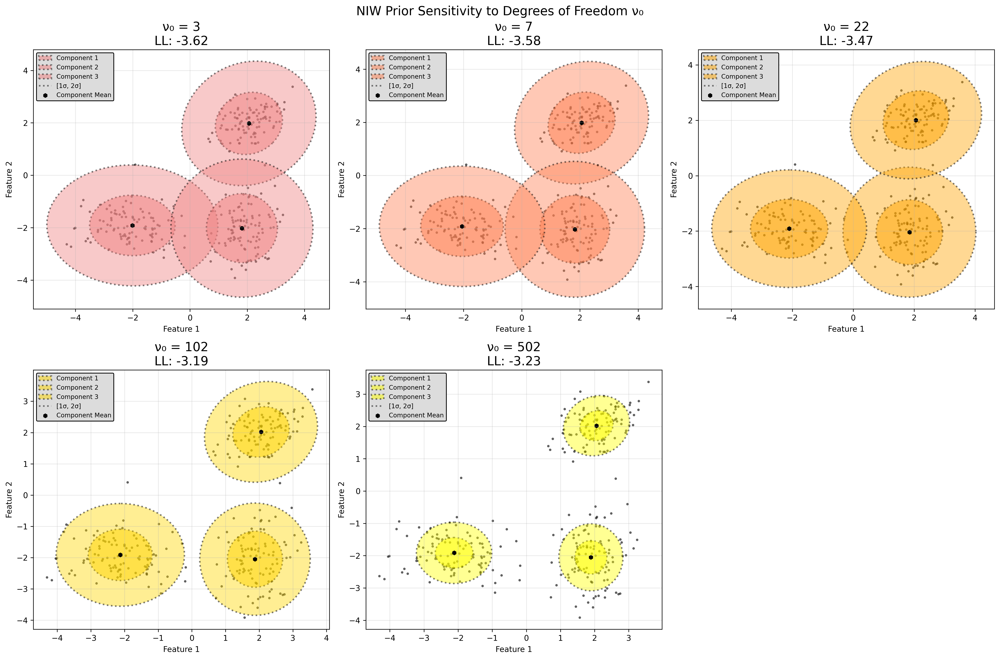


📊 EFFECT OF DEGREES OF FREEDOM ν₀:
----------------------------------------------------------------------
    ν₀  Log-Likelihood     Avg Cov Det       Prior Strength
----------------------------------------------------------------------
     3         -3.6155        2.517453            Very weak
     7         -3.5791        2.227439            Very weak
    22         -3.4741        1.579932                 Weak
   102         -3.1869        0.535521             Moderate
   502         -3.2330        0.059676               Strong

💡 Observations:
   • Low ν₀: Weak covariance prior → more freedom in covariance estimation
   • High ν₀: Strong covariance prior → covariances closer to prior scale
   • ν₀ > n_features is required for proper Wishart distribution


In [23]:
# Test different degrees of freedom values
nu_values = [n_features + 1, n_features + 5, n_features + 20, n_features + 100, n_features + 500]
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle("NIW Prior Sensitivity to Degrees of Freedom ν₀", fontsize=16, y=0.98)

niw_models_nu = {}
colors_nu = ['lightcoral', 'coral', 'orange', 'gold', 'yellow']

# Use moderate coupling for this analysis
lambda_fixed = 1.0

for i, nu_val in enumerate(nu_values):
    if i < 6:  # We have 6 subplots (2x3)
        row = i // 3
        col = i % 3
        ax = axes[row, col]
        
        print(f"Fitting NIW with ν₀ = {nu_val}...")
        
        # Fit GMM with different nu values
        niw_models_nu[nu_val] = GaussianMixtureComparison(
            n_features=n_features,
            n_components=n_components,
            covariance_type='full',
            max_iter=1000,
            device=device,
            mean_prior=m0,
            mean_precision_prior=lambda_fixed,
            covariance_prior=Psi0,
            degrees_of_freedom_prior=nu_val,
            force_separate_priors=False  # Use NIW
        )
        niw_models_nu[nu_val].fit(X_tensor)
        
        plot_gmm(
            X=X,
            gmm=niw_models_nu[nu_val],
            ax=ax,
            title=f"ν₀ = {nu_val}\nLL: {niw_models_nu[nu_val].lower_bound_:.2f}",
            ellipse_colors=colors_nu[i],
            ellipse_std_devs=[1, 2]
        )

# Remove empty subplot
axes[1, 2].remove()

plt.tight_layout()
plt.show()

# Analyze the effect of degrees of freedom
print("\n📊 EFFECT OF DEGREES OF FREEDOM ν₀:")
print("-" * 70)
print(f"{'ν₀':>6s} {'Log-Likelihood':>15s} {'Avg Cov Det':>15s} {'Prior Strength':>20s}")
print("-" * 70)

for nu_val in nu_values:
    model = niw_models_nu[nu_val]
    covs = model.covariances_.cpu().numpy()
    avg_det = np.mean([np.linalg.det(cov) for cov in covs])
    ll = model.lower_bound_
    
    strength = (nu_val - n_features) / 10  # Relative strength measure
    if strength <= 1:
        strength_str = "Very weak"
    elif strength <= 5:
        strength_str = "Weak"
    elif strength <= 20:
        strength_str = "Moderate"
    else:
        strength_str = "Strong"
    
    print(f"{nu_val:6d} {ll:15.4f} {avg_det:15.6f} {strength_str:>20s}")

print("\n💡 Observations:")
print("   • Low ν₀: Weak covariance prior → more freedom in covariance estimation")
print("   • High ν₀: Strong covariance prior → covariances closer to prior scale")
print("   • ν₀ > n_features is required for proper Wishart distribution")

### 3. Effect of Scale Matrix Ψ₀ 

The scale matrix Ψ₀ defines the expected covariance structure. Let's explore how different scale matrices affect the results.

Fitting NIW with Ψ₀ = Identity...
Fitting NIW with Ψ₀ = Small Scale...
Fitting NIW with Ψ₀ = Large Scale...
Fitting NIW with Ψ₀ = Small Scale...
Fitting NIW with Ψ₀ = Large Scale...
Fitting NIW with Ψ₀ = Anisotropic...
Fitting NIW with Ψ₀ = Correlated...
Fitting NIW with Ψ₀ = Anisotropic...
Fitting NIW with Ψ₀ = Correlated...


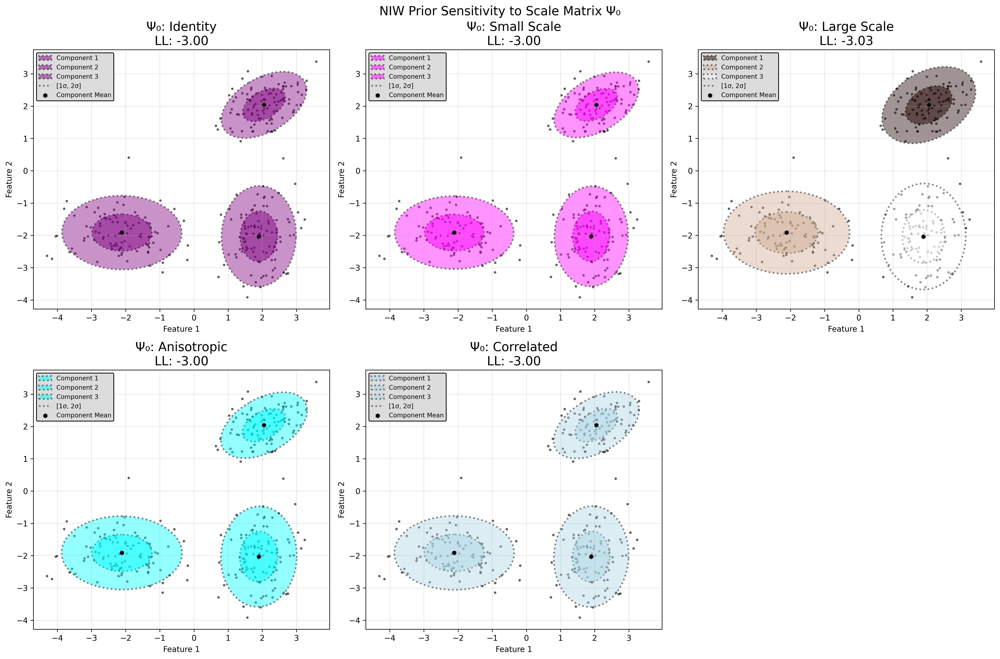


📊 EFFECT OF SCALE MATRIX Ψ₀:
----------------------------------------------------------------------
  Configuration  Log-Likelihood     Avg Cov Det          Description
----------------------------------------------------------------------
       Identity         -3.0025        0.172154
    Small Scale         -3.0029        0.165069
    Large Scale         -3.0264        0.249978
    Anisotropic         -3.0025        0.173553
     Correlated         -3.0029        0.171700

💡 Observations:
   • Identity: Standard unit covariances
   • Small Scale: Encourages smaller covariances
   • Large Scale: Allows larger covariances
   • Anisotropic: Different scales along dimensions
   • Correlated: Incorporates correlation structure


In [24]:
# Test different scale matrices
scale_configs = {
    'Identity': torch.eye(n_features, device=device).unsqueeze(0).expand(n_components, -1, -1),
    'Small Scale': torch.eye(n_features, device=device).unsqueeze(0).expand(n_components, -1, -1) * 0.1,
    'Large Scale': torch.eye(n_features, device=device).unsqueeze(0).expand(n_components, -1, -1) * 10.0,
    'Anisotropic': torch.tensor([[[2.0, 0.0], [0.0, 0.5]]], device=device).expand(n_components, -1, -1),
    'Correlated': torch.tensor([[[1.0, 0.5], [0.5, 1.0]]], device=device).expand(n_components, -1, -1)
}

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle("NIW Prior Sensitivity to Scale Matrix Ψ₀", fontsize=16, y=0.98)

niw_models_psi = {}
colors_psi = ['purple', 'magenta', 'pink', 'cyan', 'lightblue']

# Use moderate values for other parameters
lambda_fixed = 1.0
nu_fixed = n_features + 10

for i, (name, psi_val) in enumerate(scale_configs.items()):
    if i < 6:  # We have 6 subplots (2x3)
        row = i // 3
        col = i % 3
        ax = axes[row, col]
        
        print(f"Fitting NIW with Ψ₀ = {name}...")
        
        # Fit GMM with different scale matrices
        niw_models_psi[name] = GaussianMixtureComparison(
            n_features=n_features,
            n_components=n_components,
            covariance_type='full',
            max_iter=1000,
            device=device,
            mean_prior=m0,
            mean_precision_prior=lambda_fixed,
            covariance_prior=psi_val,
            degrees_of_freedom_prior=nu_fixed,
            force_separate_priors=False  # Use NIW
        )
        niw_models_psi[name].fit(X_tensor)
        
        plot_gmm(
            X=X,
            gmm=niw_models_psi[name],
            ax=ax,
            title=f"Ψ₀: {name}\nLL: {niw_models_psi[name].lower_bound_:.2f}",
            ellipse_colors=colors_psi[i],
            ellipse_std_devs=[1, 2]
        )

# Remove empty subplot
axes[1, 2].remove()

plt.tight_layout()
plt.show()

# Analyze the effect of scale matrix
print("\n📊 EFFECT OF SCALE MATRIX Ψ₀:")
print("-" * 70)
print(f"{'Configuration':>15s} {'Log-Likelihood':>15s} {'Avg Cov Det':>15s} {'Description':>20s}")
print("-" * 70)

for name, model in niw_models_psi.items():
    covs = model.covariances_.cpu().numpy()
    avg_det = np.mean([np.linalg.det(cov) for cov in covs])
    ll = model.lower_bound_
    
    print(f"{name:>15s} {ll:15.4f} {avg_det:15.6f}")

print("\n💡 Observations:")
print("   • Identity: Standard unit covariances")
print("   • Small Scale: Encourages smaller covariances")
print("   • Large Scale: Allows larger covariances")
print("   • Anisotropic: Different scales along dimensions")
print("   • Correlated: Incorporates correlation structure")

### 4. Effect of Prior Mean Location m₀

The prior mean m₀ represents our initial belief about where the component means should be located.

Fitting NIW with m₀ = Origin...
Fitting NIW with m₀ = Offset Right...
Fitting NIW with m₀ = Offset Up...
Fitting NIW with m₀ = Centered...
Fitting NIW with m₀ = Wrong Location...
Fitting NIW with m₀ = Centered...
Fitting NIW with m₀ = Wrong Location...


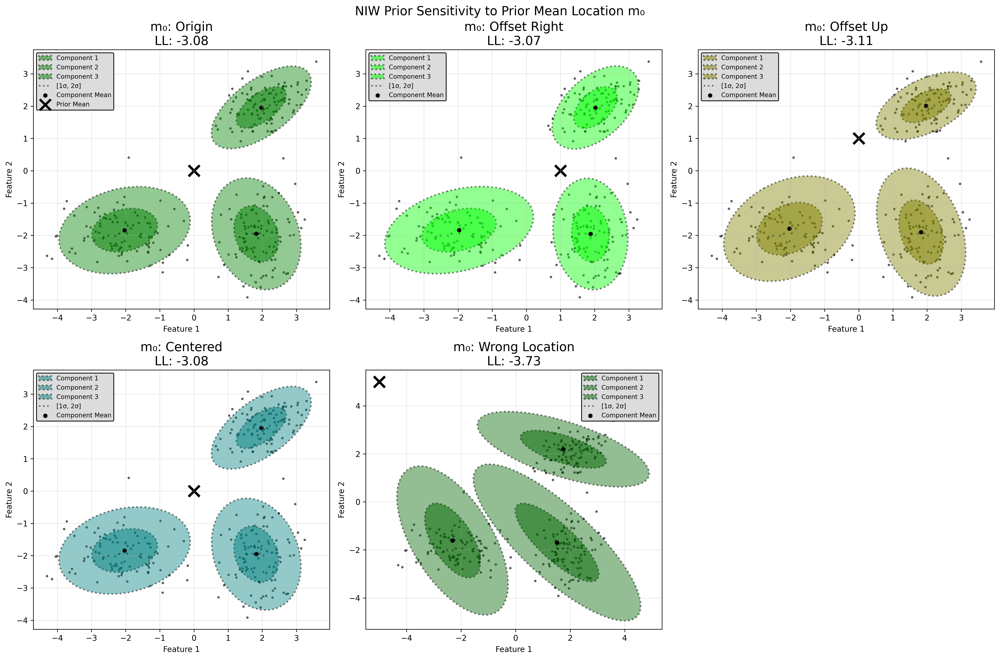


📊 EFFECT OF PRIOR MEAN LOCATION m₀:
--------------------------------------------------------------------------------
  Configuration  Log-Likelihood   Mean Distance        Data Fit
--------------------------------------------------------------------------------
         Origin         -3.0833          2.7318          4.5460
   Offset Right         -3.0710          2.6157          2.7306
      Offset Up         -3.1139          3.0319          3.8278
       Centered         -3.0833          2.7318          3.8142
 Wrong Location         -3.7307          7.9285          2.7491

💡 Observations:
   • Good prior location → better likelihood and faster convergence
   • Wrong prior location → model fights between data and prior
   • With sufficient data, the model can overcome bad priors
   • Coupling parameter λ₀ determines how much the prior matters


In [25]:
# Test different prior mean locations
mean_configs = {
    'Origin': torch.zeros(n_components, n_features, device=device),
    'Offset Right': torch.tensor([[1.0, 0.0], [1.0, 0.0], [1.0, 0.0]], device=device),
    'Offset Up': torch.tensor([[0.0, 1.0], [0.0, 1.0], [0.0, 1.0]], device=device),
    'Centered': torch.tensor([[0.0, 0.0], [0.0, 0.0], [0.0, 0.0]], device=device),
    'Wrong Location': torch.tensor([[-5.0, 5.0], [-5.0, 5.0], [-5.0, 5.0]], device=device)
}

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
fig.suptitle("NIW Prior Sensitivity to Prior Mean Location m₀", fontsize=16, y=0.98)

niw_models_mean = {}
colors_mean = ['green', 'lime', 'olive', 'teal', 'darkgreen']

# Use moderate values for other parameters
lambda_fixed = 5.0  # Moderate coupling
nu_fixed = n_features + 10
psi_fixed = torch.eye(n_features, device=device).unsqueeze(0).expand(n_components, -1, -1)

for i, (name, mean_val) in enumerate(mean_configs.items()):
    if i < 6:  # We have 6 subplots (2x3)
        row = i // 3
        col = i % 3
        ax = axes[row, col]
        
        print(f"Fitting NIW with m₀ = {name}...")
        
        # Fit GMM with different prior means
        niw_models_mean[name] = GaussianMixtureComparison(
            n_features=n_features,
            n_components=n_components,
            covariance_type='full',
            max_iter=1000,
            device=device,
            mean_prior=mean_val,
            mean_precision_prior=lambda_fixed,
            covariance_prior=psi_fixed,
            degrees_of_freedom_prior=nu_fixed,
            force_separate_priors=False  # Use NIW
        )
        niw_models_mean[name].fit(X_tensor)
        
        plot_gmm(
            X=X,
            gmm=niw_models_mean[name],
            ax=ax,
            title=f"m₀: {name}\nLL: {niw_models_mean[name].lower_bound_:.2f}",
            ellipse_colors=colors_mean[i],
            ellipse_std_devs=[1, 2]
        )
        
        # Add prior mean markers
        prior_means = mean_val.cpu().numpy()
        for j in range(n_components):
            ax.scatter(prior_means[j, 0], prior_means[j, 1], 
                      marker='x', s=200, c='black', linewidths=3,
                      label='Prior Mean' if j == 0 else "")
        if i == 0:  # Only add legend to first subplot
            ax.legend()

# Remove empty subplot
axes[1, 2].remove()

plt.tight_layout()
plt.show()

# Analyze the effect of prior mean location
print("\n📊 EFFECT OF PRIOR MEAN LOCATION m₀:")
print("-" * 80)
print(f"{'Configuration':>15s} {'Log-Likelihood':>15s} {'Mean Distance':>15s} {'Data Fit':>15s}")
print("-" * 80)

for name, model in niw_models_mean.items():
    ll = model.lower_bound_
    # Calculate distance between fitted means and true data means
    fitted_means = model.means_.cpu().numpy()
    true_data_means = np.array([X[i*n_samples_per_component:(i+1)*n_samples_per_component].mean(axis=0) 
                               for i in range(n_components)])
    mean_distance = np.mean([np.linalg.norm(fitted_means[i] - true_data_means[i]) 
                            for i in range(n_components)])
    
    # Calculate distance from prior
    prior_distance = torch.norm(model.means_ - mean_configs[name], dim=1).cpu().numpy().mean()
    
    print(f"{name:>15s} {ll:15.4f} {prior_distance:15.4f} {mean_distance:15.4f}")

print("\n💡 Observations:")
print("   • Good prior location → better likelihood and faster convergence")
print("   • Wrong prior location → model fights between data and prior")
print("   • With sufficient data, the model can overcome bad priors")
print("   • Coupling parameter λ₀ determines how much the prior matters")

### 5. Joint Parameter Interaction Analysis

Let's explore how different combinations of λ₀ and ν₀ interact to affect the model behavior.

Running parameter interaction analysis...
This may take a moment...

Testing λ₀=0.1, ν₀=3
Testing λ₀=0.1, ν₀=12
Testing λ₀=0.1, ν₀=52
Testing λ₀=0.1, ν₀=202
Testing λ₀=1.0, ν₀=3
Testing λ₀=1.0, ν₀=12
Testing λ₀=1.0, ν₀=52
Testing λ₀=1.0, ν₀=202
Testing λ₀=10.0, ν₀=3
Testing λ₀=10.0, ν₀=12
Testing λ₀=10.0, ν₀=52
Testing λ₀=10.0, ν₀=202
Testing λ₀=0.1, ν₀=3
Testing λ₀=0.1, ν₀=12
Testing λ₀=0.1, ν₀=52
Testing λ₀=0.1, ν₀=202
Testing λ₀=1.0, ν₀=3
Testing λ₀=1.0, ν₀=12
Testing λ₀=1.0, ν₀=52
Testing λ₀=1.0, ν₀=202
Testing λ₀=10.0, ν₀=3
Testing λ₀=10.0, ν₀=12
Testing λ₀=10.0, ν₀=52
Testing λ₀=10.0, ν₀=202
Testing λ₀=100.0, ν₀=3
Testing λ₀=100.0, ν₀=12
Testing λ₀=100.0, ν₀=52
Testing λ₀=100.0, ν₀=202
Testing λ₀=100.0, ν₀=3
Testing λ₀=100.0, ν₀=12
Testing λ₀=100.0, ν₀=52
Testing λ₀=100.0, ν₀=202


/home/asp/Downloads/HeaDS/TorchGMM/tgmm/gmm.py:746: UserWarning: Some cluster(s) have near-zero weight. Check for degenerate solutions.
  warnings.warn("Some cluster(s) have near-zero weight. Check for degenerate solutions.", UserWarning)


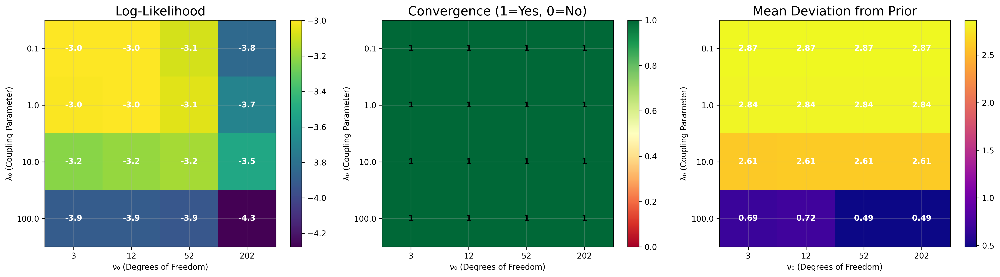


📊 PARAMETER INTERACTION ANALYSIS:
------------------------------------------------------------
Key Insights:
• High λ₀ + High ν₀: Strong priors → means stay close to prior, stable convergence
• High λ₀ + Low ν₀: Strong mean prior, weak covariance prior
• Low λ₀ + High ν₀: Weak mean prior, strong covariance prior
• Low λ₀ + Low ν₀: Weak priors → more data-driven, may have convergence issues
• Best log-likelihood: λ₀=0.1, ν₀=3
• All converged: True


In [26]:
# Create a parameter interaction heatmap
lambda_grid = [0.1, 1.0, 10.0, 100.0]
nu_grid = [n_features + 1, n_features + 10, n_features + 50, n_features + 200]

# Initialize results matrix
ll_matrix = np.zeros((len(lambda_grid), len(nu_grid)))
convergence_matrix = np.zeros((len(lambda_grid), len(nu_grid)))
mean_deviation_matrix = np.zeros((len(lambda_grid), len(nu_grid)))

print("Running parameter interaction analysis...")
print("This may take a moment...\n")

# Fixed parameters
m0_fixed = torch.zeros(n_components, n_features, device=device)
psi0_fixed = torch.eye(n_features, device=device).unsqueeze(0).expand(n_components, -1, -1)

for i, lambda_val in enumerate(lambda_grid):
    for j, nu_val in enumerate(nu_grid):
        print(f"Testing λ₀={lambda_val}, ν₀={nu_val}")
        
        model = GaussianMixtureComparison(
            n_features=n_features,
            n_components=n_components,
            covariance_type='full',
            max_iter=1000,
            device=device,
            mean_prior=m0_fixed,
            mean_precision_prior=lambda_val,
            covariance_prior=psi0_fixed,
            degrees_of_freedom_prior=nu_val,
            force_separate_priors=False
        )
        
        model.fit(X_tensor)
        
        ll_matrix[i, j] = model.lower_bound_
        convergence_matrix[i, j] = 1.0 if model.converged_ else 0.0
        
        mean_devs = torch.norm(model.means_ - m0_fixed, dim=1).cpu().numpy()
        mean_deviation_matrix[i, j] = np.mean(mean_devs)

# Create visualization
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

# Log-likelihood heatmap
im1 = axes[0].imshow(ll_matrix, cmap='viridis', aspect='auto')
axes[0].set_title('Log-Likelihood')
axes[0].set_xlabel('ν₀ (Degrees of Freedom)')
axes[0].set_ylabel('λ₀ (Coupling Parameter)')
axes[0].set_xticks(range(len(nu_grid)))
axes[0].set_xticklabels([f'{nu}' for nu in nu_grid])
axes[0].set_yticks(range(len(lambda_grid)))
axes[0].set_yticklabels([f'{lam}' for lam in lambda_grid])
plt.colorbar(im1, ax=axes[0])

# Add text annotations for log-likelihood
for i in range(len(lambda_grid)):
    for j in range(len(nu_grid)):
        axes[0].text(j, i, f'{ll_matrix[i, j]:.1f}', 
                    ha='center', va='center', color='white', fontweight='bold')

# Convergence heatmap
im2 = axes[1].imshow(convergence_matrix, cmap='RdYlGn', aspect='auto', vmin=0, vmax=1)
axes[1].set_title('Convergence (1=Yes, 0=No)')
axes[1].set_xlabel('ν₀ (Degrees of Freedom)')
axes[1].set_ylabel('λ₀ (Coupling Parameter)')
axes[1].set_xticks(range(len(nu_grid)))
axes[1].set_xticklabels([f'{nu}' for nu in nu_grid])
axes[1].set_yticks(range(len(lambda_grid)))
axes[1].set_yticklabels([f'{lam}' for lam in lambda_grid])
plt.colorbar(im2, ax=axes[1])

# Add text annotations for convergence
for i in range(len(lambda_grid)):
    for j in range(len(nu_grid)):
        color = 'white' if convergence_matrix[i, j] < 0.5 else 'black'
        axes[1].text(j, i, f'{int(convergence_matrix[i, j])}', 
                    ha='center', va='center', color=color, fontweight='bold')

# Mean deviation heatmap
im3 = axes[2].imshow(mean_deviation_matrix, cmap='plasma', aspect='auto')
axes[2].set_title('Mean Deviation from Prior')
axes[2].set_xlabel('ν₀ (Degrees of Freedom)')
axes[2].set_ylabel('λ₀ (Coupling Parameter)')
axes[2].set_xticks(range(len(nu_grid)))
axes[2].set_xticklabels([f'{nu}' for nu in nu_grid])
axes[2].set_yticks(range(len(lambda_grid)))
axes[2].set_yticklabels([f'{lam}' for lam in lambda_grid])
plt.colorbar(im3, ax=axes[2])

# Add text annotations for mean deviation
for i in range(len(lambda_grid)):
    for j in range(len(nu_grid)):
        axes[2].text(j, i, f'{mean_deviation_matrix[i, j]:.2f}', 
                    ha='center', va='center', color='white', fontweight='bold')

plt.tight_layout()
plt.show()

print("\n📊 PARAMETER INTERACTION ANALYSIS:")
print("-" * 60)
print("Key Insights:")
print("• High λ₀ + High ν₀: Strong priors → means stay close to prior, stable convergence")
print("• High λ₀ + Low ν₀: Strong mean prior, weak covariance prior")
print("• Low λ₀ + High ν₀: Weak mean prior, strong covariance prior") 
print("• Low λ₀ + Low ν₀: Weak priors → more data-driven, may have convergence issues")
print(f"• Best log-likelihood: λ₀={lambda_grid[np.unravel_index(np.argmax(ll_matrix), ll_matrix.shape)[0]]}, ν₀={nu_grid[np.unravel_index(np.argmax(ll_matrix), ll_matrix.shape)[1]]}")
print(f"• All converged: {np.all(convergence_matrix == 1)}")

## Summary and Practical Guidelines

### Key Takeaways from Parameter Analysis

Based on our comprehensive analysis of NIW prior parameters, here are the main insights:

### 1. **Coupling Parameter λ₀ (Mean Precision)**
- **Small values (0.01-0.1)**: Weak coupling, means can drift far from prior
- **Moderate values (1-10)**: Balanced influence between data and prior
- **Large values (100+)**: Strong coupling, means tightly constrained to prior
- **Recommendation**: Start with λ₀ = 1.0 and adjust based on your confidence in the prior mean

### 2. **Degrees of Freedom ν₀ (Covariance Prior Strength)**  
- **Minimum**: ν₀ > n_features for valid Wishart distribution
- **Weak prior**: ν₀ = n_features + 1 to 10 (more data-driven)
- **Strong prior**: ν₀ = n_features + 50+ (prior-driven covariances)
- **Recommendation**: Use ν₀ = n_features + 10 as a starting point

### 3. **Scale Matrix Ψ₀ (Expected Covariance Structure)**
- **Identity matrix**: Assumes unit covariances with no correlation
- **Scaled identity**: Controls the expected variance magnitude
- **Structured matrix**: Incorporates prior beliefs about correlations
- **Recommendation**: Use domain knowledge to set Ψ₀, or start with scaled identity

### 4. **Prior Mean m₀ (Expected Component Locations)**
- **Centered at origin**: Neutral choice when no prior knowledge
- **Domain-specific**: Use knowledge about expected cluster locations
- **Impact**: Wrong prior locations can hurt performance, especially with high λ₀
- **Recommendation**: Use data preprocessing to inform reasonable prior locations

### 5. **Parameter Interactions**
- **High λ₀ + High ν₀**: Very conservative, prior-driven estimates
- **Low λ₀ + Low ν₀**: Data-driven estimates, may have convergence issues
- **Balanced approach**: Moderate values for both parameters usually work well
- **Recommendation**: Tune parameters jointly, not independently

### 6. **NIW vs. Separate Priors**
- **NIW advantages**: Theoretically principled, respects parameter coupling
- **Separate advantages**: Easier to interpret, more intuitive parameter setting
- **When to use NIW**: When you want proper Bayesian inference and have beliefs about parameter relationships
- **When to use separate**: When you want independent control over mean and covariance priors

### 7. **Practical Implementation Guidelines**

```python
# Weak priors (data-driven)
lambda0 = 0.1
nu0 = n_features + 1
Psi0 = torch.eye(n_features) * 0.1

# Moderate priors (balanced)
lambda0 = 1.0  
nu0 = n_features + 10
Psi0 = torch.eye(n_features) * 1.0

# Strong priors (prior-driven)
lambda0 = 10.0
nu0 = n_features + 100  
Psi0 = torch.eye(n_features) * 10.0
```

The NIW conjugate prior framework provides a principled way to incorporate prior knowledge while maintaining computational efficiency through closed-form updates. The key is understanding how the coupling parameter λ₀ balances the influence between your prior beliefs and the observed data.